In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import pytz
import plotly.express as px
from csaps import csaps
import plotly.graph_objects as go

# Added src directory to module_path

In [2]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [23]:
from src.pricing.implied_vola import bs_implied_vola
from src.maths.splines import natural_cubic_spline

In [4]:
NANO_IN_SECOND = 1e9
SHIFT_NANO = int((dt.datetime(1970, 1, 1, 0, 0, 0) - dt.datetime(1, 1, 1, 0, 0, 0)).total_seconds()) * NANO_IN_SECOND
TIME_ZONE = pytz.timezone('Asia/Shanghai')

# Load Underlying and Option Data

In [5]:
df_spot = pd.read_csv("data/Case2_UnderlyingData.csv")

In [6]:
def convert(tick):
    result = tick / (24 * 3600 * 1e7)
    return dt.datetime.fromordinal(int(result)) + dt.timedelta(days=result%1) - dt.timedelta(days=365)

In [7]:
df_spot["TS"] = df_spot["RecvTick"].apply(convert)
df_spot["EQUAL"] = df_spot.Bid == df_spot.Ask

In [8]:
df_spot["Timestamp"] = df_spot["TS"].dt.ceil("S")
aggregation_functions = {'Last': 'mean', 'LastVol': 'mean'}
df_spot_aggregated = df_spot.groupby(df_spot['Timestamp']).aggregate(aggregation_functions)
df_spot_aggregated.reset_index(inplace=True)

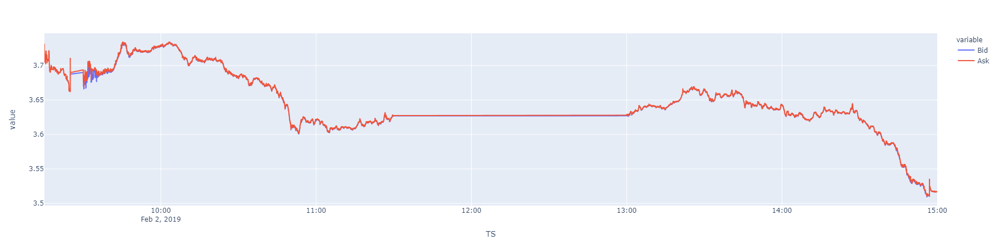

In [9]:
px.line(df_spot, x="TS", y=["Bid", "Ask"])

In [10]:
df_spot.describe()

,RecvTick,ExchTick,Bid,BidVol,Ask,AskVol,RecvTime,ExchTime,ContractId,TradingDay,Last,LastVol,Multiplier
count,3.825300e+04,3.825300e+04,38253.000000,38253.0,38253.000000,38253.0,38253.000000,38253.000000,38253.0,38253.0,38253.000000,38253.0,38253.0
mean,6.371633e+17,6.371633e+17,3.650773,1.0,3.651257,1.0,737824.505297,737824.505292,992999999.0,20200203.0,3.651015,1.0,10000.0
std,6.588683e+10,6.588661e+10,0.045265,0.0,0.045342,0.0,0.076258,0.076258,0.0,0.0,0.045300,0.0,0.0
min,6.371632e+17,6.371632e+17,3.509315,1.0,3.510645,1.0,737824.385429,737824.385423,992999999.0,20200203.0,3.509980,1.0,10000.0
25%,6.371632e+17,6.371632e+17,3.621359,1.0,3.621650,1.0,737824.434584,737824.434578,992999999.0,20200203.0,3.621492,1.0,10000.0
50%,6.371633e+17,6.371633e+17,3.642400,1.0,3.642700,1.0,737824.475060,737824.475054,992999999.0,20200203.0,3.642545,1.0,10000.0
75%,6.371633e+17,6.371633e+17,3.685741,1.0,3.687203,1.0,737824.578528,737824.578522,992999999.0,20200203.0,3.686588,1.0,10000.0
max,6.371634e+17,6.371634e+17,3.734089,1.0,3.734295,1.0,737824.625008,737824.625001,992999999.0,20200203.0,3.734109,1.0,10000.0


In [11]:
df_spot.resample("S", on="TS").Last.mean().tail()

TS
2019-02-02 14:59:56    3.517484
2019-02-02 14:59:57    3.517488
2019-02-02 14:59:58    3.517529
2019-02-02 14:59:59    3.517534
2019-02-02 15:00:00    3.517553
Freq: S, Name: Last, dtype: float64

In [13]:
df_option = pd.read_csv("data/Case2_OptionData.csv")

In [14]:
df_option["TS"] = df_option["RecvTick"].apply(convert)

In [15]:
df_option["Timestamp"] = df_option["TS"].dt.ceil("10S")

In [16]:
df_option.head()

,ContractId,TradingDay,Bid,Ask,Last,BidVol,AskVol,LastVol,AveragePrice,RecvTick,...,BidVol5,Ask5,AskVol5,RecvTime,ExchTime,Expiry,Strike,OptionType,TS,Timestamp
0,2010152390,20200203,0.1505,0.1505,0.1505,16,16,0,0.1505,637163181005780478,...,0,0.0,0,737824.385423,737824.385423,20200226,3.9,Put,2019-02-02 09:15:00.578046,2019-02-02 09:15:10
1,2010102400,20200203,0.0003,0.0003,0.0003,2,2,0,0.0003,637163181005780778,...,0,0.0,0,737824.385423,737824.385423,20200226,4.0,Call,2019-02-02 09:15:00.578076,2019-02-02 09:15:10
2,2010102410,20200203,0.0008,0.0008,0.0008,6,6,0,0.0008,637163181005780803,...,0,0.0,0,737824.385423,737824.385423,20200226,4.1,Call,2019-02-02 09:15:00.578086,2019-02-02 09:15:10
3,2010152400,20200203,0.2444,0.2444,0.2444,6,6,0,0.2444,637163181005780828,...,0,0.0,0,737824.385423,737824.385423,20200226,4.0,Put,2019-02-02 09:15:00.578086,2019-02-02 09:15:10
4,2010152410,20200203,0.3870,0.3870,0.3870,7,7,0,0.3870,637163181005780834,...,0,0.0,0,737824.385423,737824.385423,20200226,4.1,Put,2019-02-02 09:15:00.578086,2019-02-02 09:15:10


# Group option date by timestamp

In [17]:
group_by_ts = df_option.groupby("Timestamp")

In [50]:
def prior(strikes):
    return 0.2 + 0.5 * (strikes - 4)**2

In [18]:
# 24 days in business time
T = 24 / 252
def bid_ask_vol(row):
    row["AskVol"] = bs_implied_vola(row["Strike"], T, spot, row["OptionType"], row["Ask"])
    row["BidVol"] = bs_implied_vola(row["Strike"], T, spot, row["OptionType"], row["Bid"])
    row["MidVol"] = (row["AskVol"] + row["BidVol"]) / 2
    row["HalfSpreadVol"] = (row["AskVol"] - row["BidVol"]) / 2
    return row

In [36]:
def one_timestamp(ts: dt.datetime, spot: float, group: pd.DataFrame, lmda: float = 0.0):
        group_copy = group.copy()
        group_bid_ask = group_copy.groupby("Strike").apply(lambda g: g.sort_values(by="TS")[["Bid", "Ask", "OptionType"]].tail(1))
        group_bid_ask.reset_index(inplace=True)
        group_bid_ask["HalfSpread"] = (group_bid_ask["Bid"] - group_bid_ask["Ask"]) / 2
        group_bid_ask["Mid"] = (group_bid_ask["Bid"] + group_bid_ask["Ask"]) / 2
        group_bid_ask = group_bid_ask.apply(bid_ask_vol, axis=1)
               
        strikes = group_bid_ask["Strike"].values
        mid_vols = group_bid_ask["MidVol"].values
        weights = 1.0 / group_bid_ask["HalfSpreadVol"]
        prior_vols = prior(strikes)
        fitted_vols = natural_cubic_spline(strikes, mid_vols, lmda, prior_vols)
        group_bid_ask["FittedVol"] = fitted_vols
        trace_fitted = go.Scatter(
            x=strikes,
            y=fitted_vols,
            mode="lines+markers",
            name="Fitted Vol"
        )

        group_call = group_bid_ask.query("OptionType == 'Call'")
        strikes_call = group_call["Strike"]
        mid_vols_call = group_call["MidVol"]
        half_spread_vols_call = group_call["HalfSpreadVol"]
        trace_call = go.Scatter(
            x=strikes_call,
            y=mid_vols_call,
            error_y=dict(
                type="data",
                array=half_spread_vols_call,
                visible=True
            ),
            mode="markers",
            name="Call Input Vol"
        )
        
        group_put = group_bid_ask.query("OptionType == 'Put'")
        strikes_put = group_put["Strike"]
        mid_vols_put = group_put["MidVol"]
        half_spread_vols_put = group_put["HalfSpreadVol"]
        trace_put = go.Scatter(
            x=strikes_put,
            y=mid_vols_put,
            error_y=dict(
                type="data",
                array=half_spread_vols_put,
                visible=True
            ),
            mode="markers",
            name="Put Input Vol"
        )
        
        data = [trace_call, trace_put, trace_fitted]
        layout = dict(
            width=1000,
            height=600
        )
        fig = go.Figure(data=data, layout=layout)
        return fig

# Fit the first timestamp after current_ts

In [37]:
current_ts = dt.datetime(2019, 2, 2, 14, 45, 1)

In [52]:
# Change smoothing_factor to see the impact of the fit, range [0.0, 1.0]
lmda = 100.0

Handling timstemp 2019-02-02 14:45:10
current_spot = 3.569852732513333


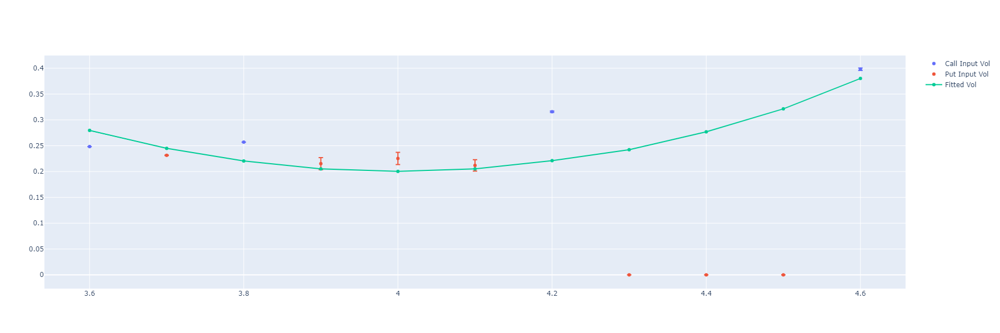

In [53]:
counter = 0
for key, group in group_by_ts:
    if counter >=1:
        continue
    if key > current_ts:
        spot = df_spot_aggregated[df_spot_aggregated["Timestamp"] > key]["Last"].iloc[0]
        print(f"Handling timstemp {key}")
        print(f"current_spot = {spot}")
        fig = one_timestamp(key, spot, group, lmda=lmda)
        fig.show()

        counter += 1    